In [3]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

# Visualizacion de Datos
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
data = pd.read_csv('../../datasetsGrandes/spotifySongs/tracks.csv')
data.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [5]:
data.shape

(586672, 20)

In [6]:
data.count()

id                  586672
name                586601
popularity          586672
duration_ms         586672
explicit            586672
artists             586672
id_artists          586672
release_date        586672
danceability        586672
energy              586672
key                 586672
loudness            586672
mode                586672
speechiness         586672
acousticness        586672
instrumentalness    586672
liveness            586672
valence             586672
tempo               586672
time_signature      586672
dtype: int64

In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


In [8]:
#Data Profiling
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

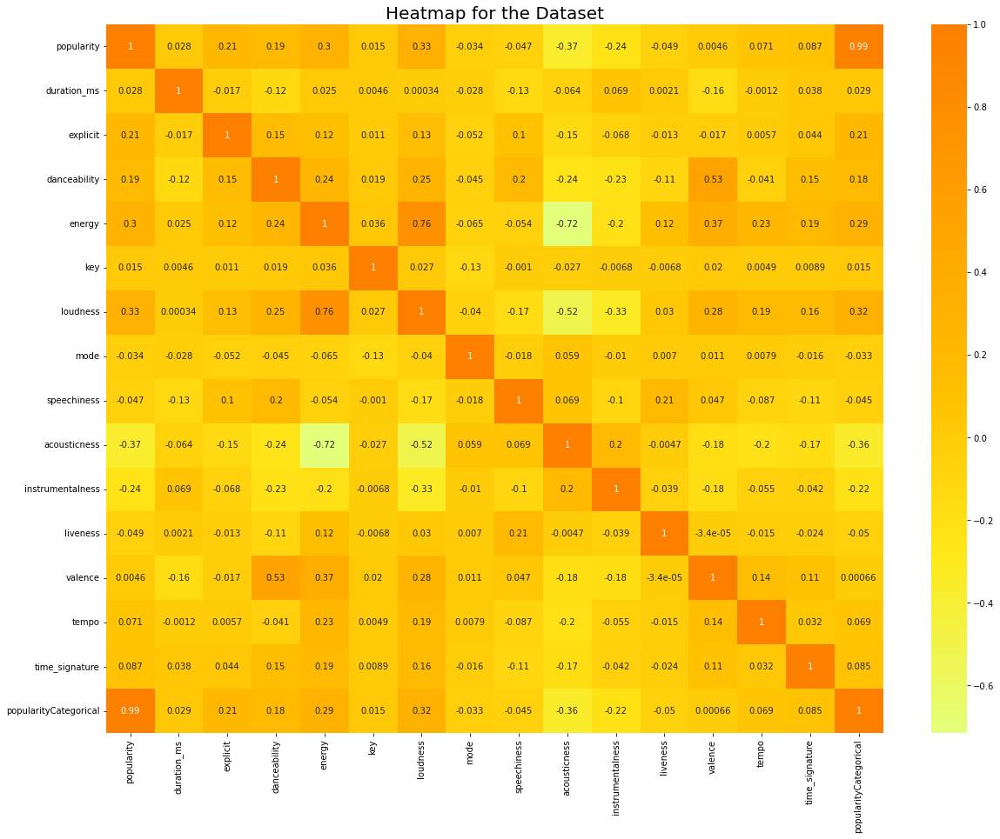

In [14]:
#Hagamos un HeatMap del df
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (20, 15)
    sns.heatmap(data.corr(), annot = True, cmap = 'Wistia')
    plt.title('Heatmap for the Dataset', fontsize = 20)
    plt.show()

Some of the audio features that describe songs/tracks are:

Loudness: Volumen
Popularity: Cuan popular es el tema
Acousticness: Whether the song/track is acoustic or not.
Tempo: The tempo of the song/track, measured in beats per minute (BPM).
Energy: How energetic the song/track is.
Liveness: Whether a live audience is present or the song/track is studio recorded.
Valence: How positive the the music is.

Voy a elegir las variables mas fuertemente relacionadas segun el heat map: Popularity vs loudness (0.33) // Valence vs danceability (0.53) // Loudness vs energy (0.73)

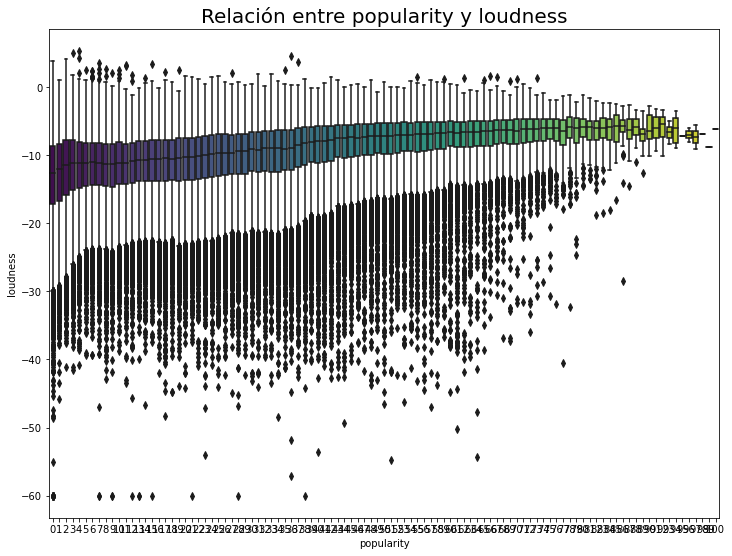

In [15]:
# popularity vs loudness
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.boxplot(x='popularity', y='loudness', data=data, palette = 'viridis')
    plt.title('Relación entre popularity y loudness', fontsize = 20)
    plt.show()

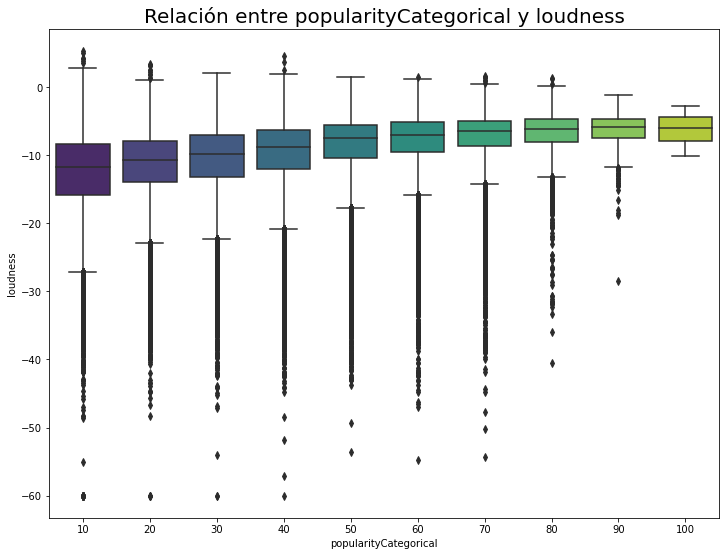

In [16]:
def f(row):
    if row['popularity'] < 10:
        val = 10
    elif row['popularity'] < 20:
        val = 20
    elif row['popularity'] < 30:
        val = 30
    elif row['popularity'] < 40:
        val = 40
    elif row['popularity'] < 50:
        val = 50
    elif row['popularity'] < 60:
        val = 60
    elif row['popularity'] < 70:
        val = 70
    elif row['popularity'] < 80:
        val = 80
    elif row['popularity'] < 90:
        val = 90
    else:
        val = 100
    return val

data['popularityCategorical'] = data.apply(f, axis=1)
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.boxplot(x='popularityCategorical', y='loudness', data=data, palette = 'viridis')
    plt.title('Relación entre popularityCategorical y loudness', fontsize = 20)
    plt.show()

La ultima grafica nos sugiere que a medida que aumenta la popularidad de las canciones, la mayoría de estas estan en un rango acotado de loudness que va entre -7 y -12. Podemos decir que los temas mejor puntuados estan en ese rango de loudness y son los preferidos de las personas.

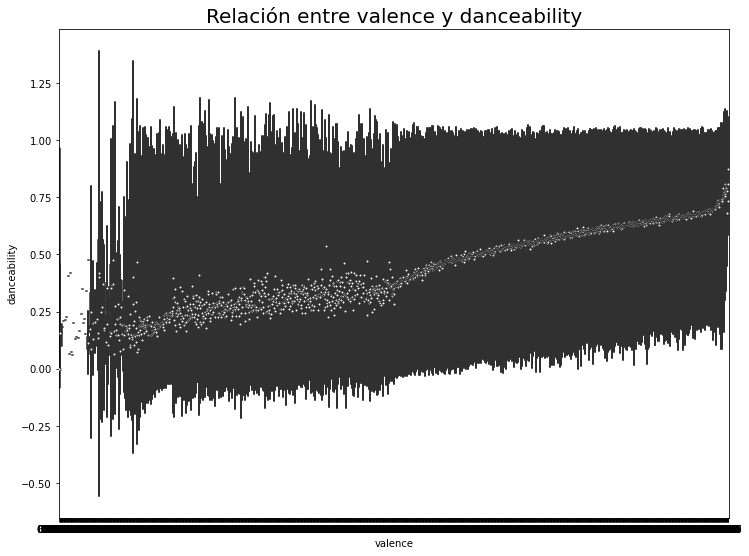

In [19]:
# Valence vs danceability
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.violinplot(x='valenceCategorical', y='danceability', data=data, palette= 'colorblind')
    plt.title('Relación entre valence y danceability', fontsize = 20, fontweight = 30)
    plt.show()

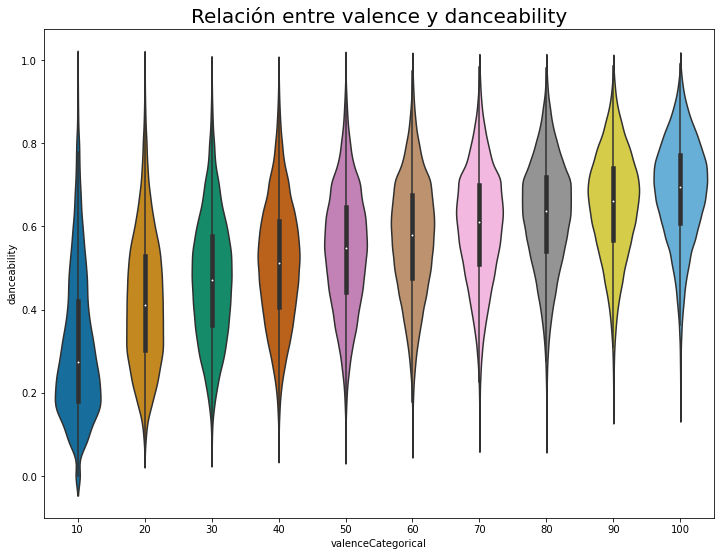

In [20]:
def valenceGroup(row):
    if row['valence'] < 0.1:
        val = 10
    elif row['valence'] < 0.2:
        val = 20
    elif row['valence'] < 0.3:
        val = 30
    elif row['valence'] < 0.4:
        val = 40
    elif row['valence'] < 0.5:
        val = 50
    elif row['valence'] < 0.6:
        val = 60
    elif row['valence'] < 0.7:
        val = 70
    elif row['valence'] < 0.8:
        val = 80
    elif row['valence'] < 0.9:
        val = 90
    else:
        val = 100
    return val

data['valenceCategorical'] = data.apply(valenceGroup, axis=1)
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (12, 9)
    sns.violinplot(x='valenceCategorical', y='danceability', data=data, palette= 'colorblind')
    plt.title('Relación entre valence y danceability', fontsize = 20, fontweight = 30)
    plt.show()

La ultima grafica nos sugiere que a medida que aumenta la positividad de las canciones, todas estas son mucho mas bailables (Se concentra la mayoria entre 0.6 y 0.8 de danceability)

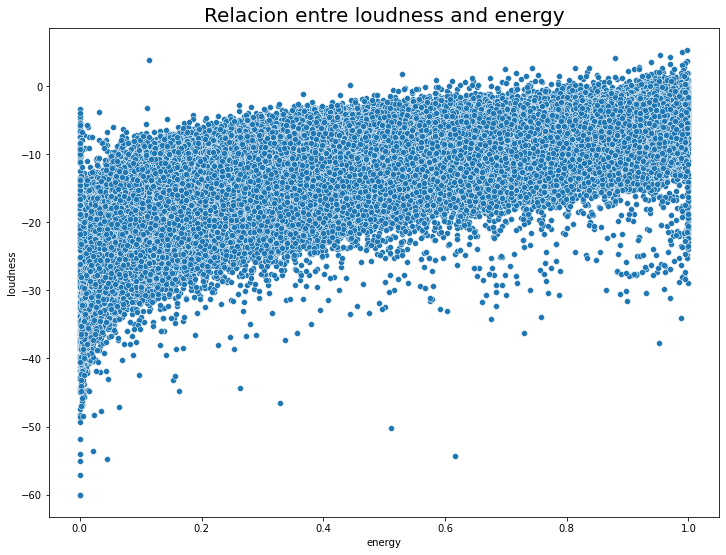

In [22]:
#Loudness vs energy
with plt.rc_context({'figure.facecolor':'white'}):
    sns.scatterplot(x="energy", y="loudness", data=data)
    plt.title('Relacion entre loudness and energy', fontsize = 20, fontweight = 30)

Algo parecido a los dos analisis anteriores, mientras mas energica la canción, la mayoria se situa en un loudness cercano a cero (-7 a -18)